In [28]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
scalar=StandardScaler()
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans,AgglomerativeClustering,DBSCAN,SpectralClustering
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn import tree
from sklearn import metrics
import plotly.subplots as sp
import plotly.graph_objs as go
import plotly.express as px
import plotly.io as pio

import warnings
warnings.filterwarnings("ignore") 

In [29]:
df = pd.read_csv("data.csv")
df

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,C19186,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8946,C19187,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,NaN,0.000000,6
8947,C19188,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8948,C19189,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


In [30]:
df.shape

(8950, 18)

In [31]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

In [34]:
df.isnull().sum()
df.drop(["CUST_ID"], axis = 1, inplace = True)

In [35]:
# filling mean value in place of missing values in the dataset
df["MINIMUM_PAYMENTS"] = df["MINIMUM_PAYMENTS"].fillna(df["MINIMUM_PAYMENTS"].mean())
df["CREDIT_LIMIT"] = df["CREDIT_LIMIT"].fillna(df["CREDIT_LIMIT"].mean())

In [36]:
#checking for null values
df.isnull().sum()

BALANCE                             0
BALANCE_FREQUENCY                   0
PURCHASES                           0
ONEOFF_PURCHASES                    0
INSTALLMENTS_PURCHASES              0
CASH_ADVANCE                        0
PURCHASES_FREQUENCY                 0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_INSTALLMENTS_FREQUENCY    0
CASH_ADVANCE_FREQUENCY              0
CASH_ADVANCE_TRX                    0
PURCHASES_TRX                       0
CREDIT_LIMIT                        0
PAYMENTS                            0
MINIMUM_PAYMENTS                    0
PRC_FULL_PAYMENT                    0
TENURE                              0
dtype: int64

In [37]:
# checking for duplicate rows in the dataset
df.duplicated().sum()

0

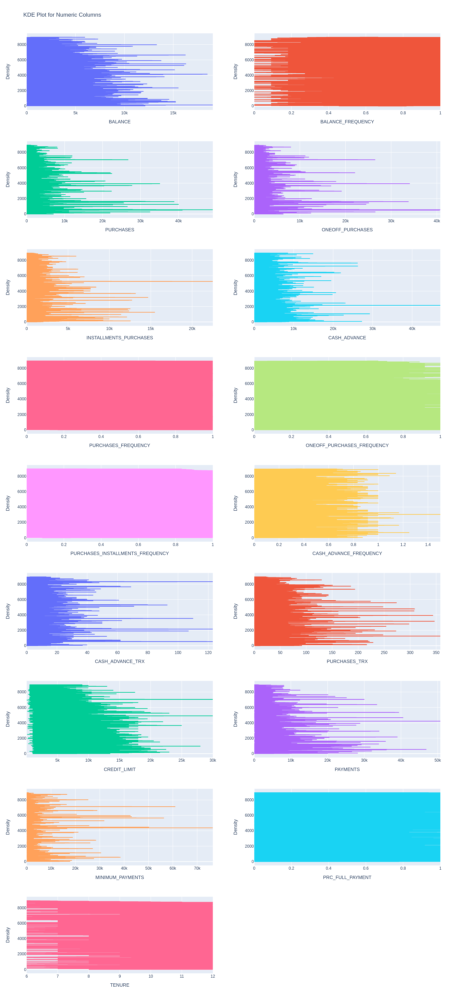

In [38]:

# Define the subplot layout
rows = 9
cols = 2
specs = [[{"type": "scatter"}]*cols for _ in range(rows)]
fig = sp.make_subplots(rows=rows, cols=cols, specs=specs)

# Plot the KDEs for each numeric column
num_cols = [col for col in df.columns if df[col].dtype != 'object']
row = 1
col = 1
for col_name in num_cols:
    trace = go.Scatter(x=df[col_name], mode='lines', line=dict(width=2))
    fig.add_trace(trace, row=row, col=col)
    fig.update_xaxes(title_text=col_name, row=row, col=col)
    fig.update_yaxes(title_text='Density', row=row, col=col)
    
    # Increment row and column counters
    col += 1
    if col > cols:
        col = 1
        row += 1

# Update the subplot layout and display the figure
fig.update_layout(title='KDE Plot for Numeric Columns', height=3000, width=2000, showlegend=False)
fig.show()

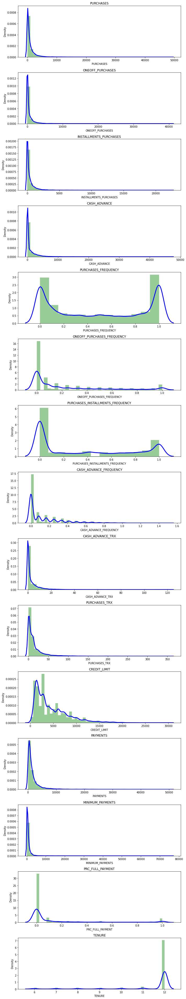

In [39]:
plt.figure(figsize=(10,60))
for i in range(2,17):
    plt.subplot(17,1,i+1)
    sns.distplot(df[df.columns[i]],kde_kws={'color':'b','bw': 0.1,'lw':3,'label':'KDE'},hist_kws={'color':'g'})
    plt.title(df.columns[i])
plt.tight_layout()

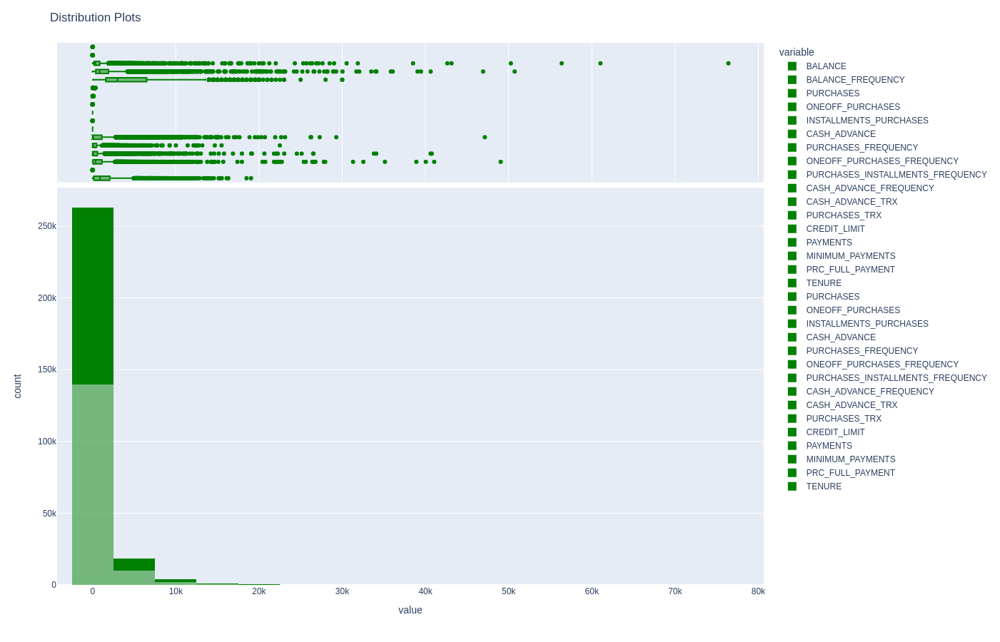

In [40]:
fig = px.histogram(df, nbins=20, opacity=0.5, marginal='box', color_discrete_sequence=['#008000'])

fig.update_layout(height=900, width=500, title_text='Distribution Plots')

for i in range(2,17):
    fig.add_trace(
        go.Histogram(x=df[df.columns[i]], name=df.columns[i], marker_color='#008000', nbinsx=20)
    )

fig.show()


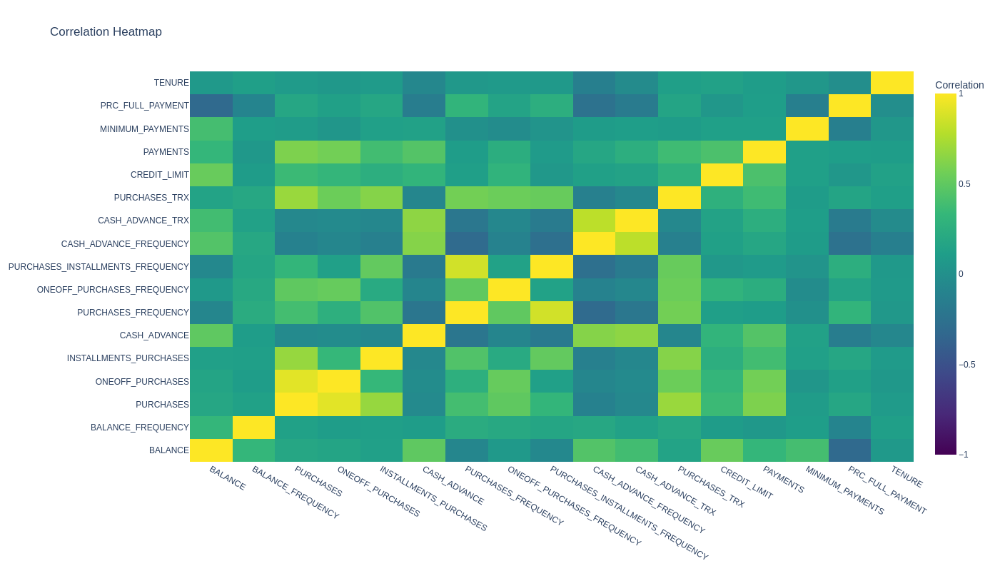

In [41]:

fig = go.Figure(data=go.Heatmap(
        z=df.corr(),
        x=df.columns,
        y=df.columns,
        colorscale='Viridis',
        colorbar=dict(title='Correlation'),
        zmin=-1,
        zmax=1,
        showscale=True,
        hoverongaps=False,
        connectgaps=False,
        hovertemplate='<b>%{y}</b><br><b>%{x}</b><br>Correlation: %{z:.2f}<extra></extra>'
    ))

fig.update_layout(title='Correlation Heatmap', width=800, height=800)

fig.show()

In [42]:
#scaling the dataframe
scaled_df = scalar.fit_transform(df)
df.to_csv("scaled_df.csv")

In [43]:
#principle compound analysis
pca = PCA(n_components=2)
principal_components = pca.fit_transform(scaled_df)
pca_df = pd.DataFrame(data=principal_components ,columns=["PCA1","PCA2"])
pca_df

,PCA1,PCA2
0,-1.682215,-1.076451
1,-1.138266,2.506490
2,0.969644,-0.383550
3,-0.873638,0.043153
4,-1.599426,-0.688577
...,...,...
8945,-0.359637,-2.016152
8946,-0.564391,-1.639139
8947,-0.926212,-1.810792
8948,-2.336536,-0.657952


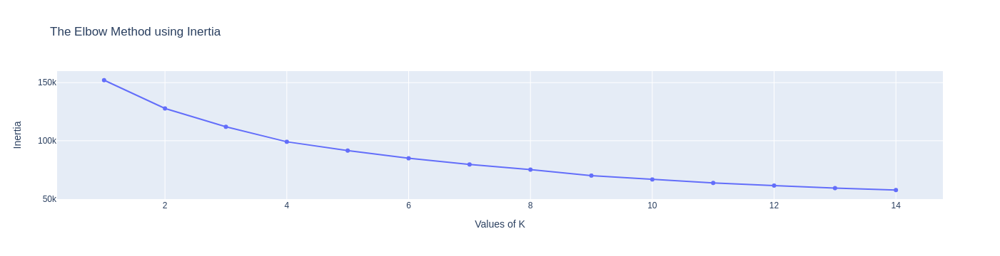

In [44]:
#hyper parameter tuning 
#k means clustering
inertia = []
range_val = range(1, 15)
for i in range_val:
    kmean = KMeans(n_clusters=i)
    kmean.fit_predict(pd.DataFrame(scaled_df))
    inertia.append(kmean.inertia_)

data = [go.Scatter(x=list(range_val), y=inertia, mode='lines+markers')]
layout = go.Layout(title='The Elbow Method using Inertia',
                   xaxis=dict(title='Values of K'),
                   yaxis=dict(title='Inertia'))

fig = go.Figure(data=data, layout=layout)

pio.show(fig)

In [45]:
kmeans_model=KMeans(4)
kmeans_model.fit_predict(scaled_df)
pca_df_kmeans= pd.concat([pca_df,pd.DataFrame({'cluster':kmeans_model.labels_})],axis=1)

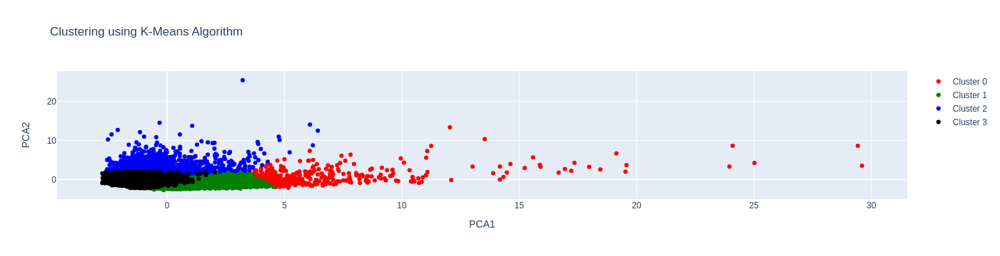

In [46]:
data = []
colors = ['red', 'green', 'blue', 'black']

for i in range(len(pca_df_kmeans['cluster'].unique())):
    df = pca_df_kmeans[pca_df_kmeans['cluster'] == i]
    trace = go.Scatter(
        x=df['PCA1'],
        y=df['PCA2'],
        mode='markers',
        name='Cluster {}'.format(i),
        marker=dict(color=colors[i])
    )
    data.append(trace)

layout = go.Layout(title='Clustering using K-Means Algorithm',
                   xaxis=dict(title='PCA1'),
                   yaxis=dict(title='PCA2'),
                   hovermode='closest')

fig = go.Figure(data=data, layout=layout)

pio.show(fig)

In [47]:
# Creating a target column "Cluster" for storing the cluster segment
cluster_df = pd.concat([df,pd.DataFrame({'Cluster':kmeans_model.labels_})],axis=1)
cluster_df

,PCA1,PCA2,cluster,Cluster
0,-1.682215,-1.076451,3.0,3
3,-0.873638,0.043153,3.0,3
4,-1.599426,-0.688577,3.0,3
8,-0.441754,-0.461856,3.0,3
9,-0.562528,-0.366369,3.0,3
...,...,...,...,...
8941,NaN,NaN,NaN,2
8942,NaN,NaN,NaN,1
8945,NaN,NaN,NaN,1
8946,NaN,NaN,NaN,1


In [48]:
cluster_1_df = cluster_df[cluster_df["Cluster"]==0]
cluster_1_df

,PCA1,PCA2,cluster,Cluster
6,NaN,NaN,NaN,0
21,NaN,NaN,NaN,0
57,NaN,NaN,NaN,0
84,NaN,NaN,NaN,0
90,NaN,NaN,NaN,0
...,...,...,...,...
8215,NaN,NaN,NaN,0
8541,NaN,NaN,NaN,0
8662,NaN,NaN,NaN,0
8689,NaN,NaN,NaN,0


In [49]:
cluster_2_df = cluster_df[cluster_df["Cluster"]==1]
cluster_2_df

,PCA1,PCA2,cluster,Cluster
2,NaN,NaN,NaN,1
5,NaN,NaN,NaN,1
7,NaN,NaN,NaN,1
10,NaN,NaN,NaN,1
12,NaN,NaN,NaN,1
...,...,...,...,...
8940,NaN,NaN,NaN,1
8942,NaN,NaN,NaN,1
8945,NaN,NaN,NaN,1
8946,NaN,NaN,NaN,1


In [50]:
cluster_3_df = cluster_df[cluster_df["Cluster"]==2]
cluster_3_df

,PCA1,PCA2,cluster,Cluster
1,NaN,NaN,NaN,2
15,NaN,NaN,NaN,2
23,NaN,NaN,NaN,2
24,NaN,NaN,NaN,2
28,NaN,NaN,NaN,2
...,...,...,...,...
8857,NaN,NaN,NaN,2
8858,NaN,NaN,NaN,2
8869,NaN,NaN,NaN,2
8915,NaN,NaN,NaN,2


In [51]:
cluster_4_df = cluster_df[cluster_df["Cluster"] == 3]
cluster_4_df

,PCA1,PCA2,cluster,Cluster
0,-1.682215,-1.076451,3.0,3
3,-0.873638,0.043153,3.0,3
4,-1.599426,-0.688577,3.0,3
8,-0.441754,-0.461856,3.0,3
9,-0.562528,-0.366369,3.0,3
...,...,...,...,...
8939,-1.377790,-0.321954,3.0,3
8943,-2.207387,-1.262066,3.0,3
8944,-1.097979,-0.792185,3.0,3
8948,-2.336536,-0.657952,3.0,3


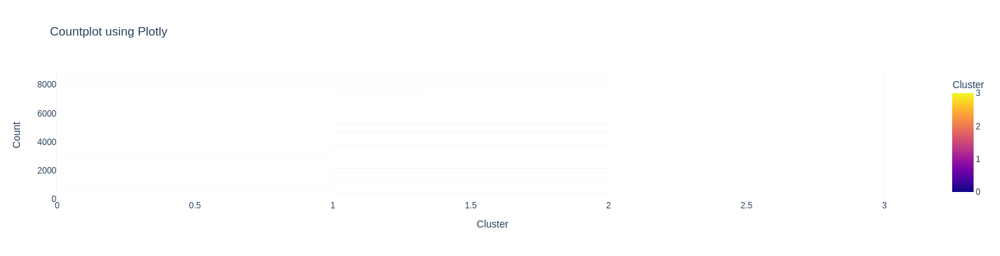

In [52]:
fig = px.bar(cluster_df, x='Cluster', color='Cluster', 
             template='plotly_white', 
             title='Countplot using Plotly')

fig.update_layout(xaxis_title='Cluster',
                  yaxis_title='Count')

pio.show(fig)

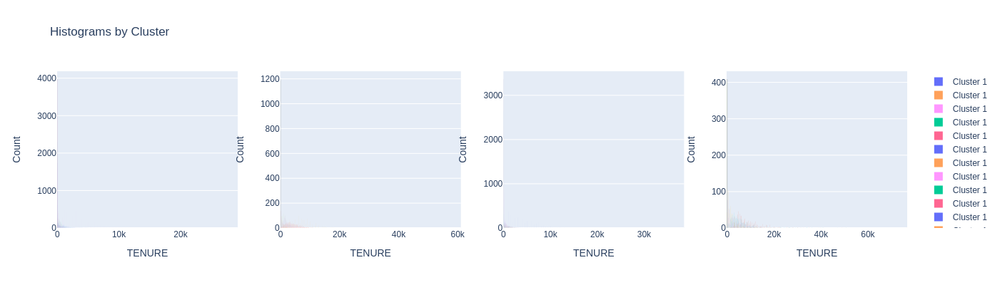

In [53]:
cluster_df = pd.read_csv('cluster_data.csv')

fig = sp.make_subplots(rows=1, cols=cluster_df['Cluster'].nunique())

for i, c in enumerate(cluster_df.drop(['Cluster'], axis=1)):
    for j, cl in enumerate(cluster_df['Cluster'].unique()):
        trace = go.Histogram(x=cluster_df[c][cluster_df['Cluster'] == cl].dropna(),
                             name='Cluster {}'.format(cl),
                             showlegend=j==0)
        fig.add_trace(trace, row=1, col=j+1)
        fig.update_xaxes(title_text=c, row=1, col=j+1)
        fig.update_yaxes(title_text='Count', row=1, col=j+1)

fig.update_layout(title='Histograms by Cluster',
                  height=400, width=800)

pio.show(fig)

In [54]:
#Saving Scikitlearn models
import joblib
joblib.dump(kmeans_model, "kmeans_model.pkl")

['kmeans_model.pkl']

In [55]:
cluster_df.to_csv("Clustered_Customer_Data.csv")

In [56]:
#Split Dataset
X = cluster_df.drop(['Cluster'],axis=1)
y= cluster_df[['Cluster']]
X_train, X_test, y_train, y_test =train_test_split(X, y, test_size=0.3)

In [57]:
X_train

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
4996,900.557796,1.000000,1865.55,1865.55,0.00,583.318150,0.583333,0.583333,0.000000,0.250000,7,20,3000.0,676.956491,232.309851,0.090909,12
4913,574.032791,1.000000,1606.51,0.00,1606.51,0.000000,1.000000,0.000000,1.000000,0.000000,0,98,1000.0,1844.561564,449.515886,0.083333,12
3528,2966.034939,1.000000,0.00,0.00,0.00,1607.410863,0.000000,0.000000,0.000000,0.250000,17,0,3500.0,770.655050,789.628075,0.000000,12
5314,53.173349,0.545455,60.00,60.00,0.00,277.129953,0.083333,0.083333,0.000000,0.083333,1,1,1200.0,2202.149777,274.519006,0.000000,12
6579,291.654079,1.000000,1528.77,1528.77,0.00,0.000000,0.416667,0.416667,0.000000,0.000000,0,9,9000.0,930.081668,122.432250,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6789,424.994385,0.375000,1200.00,1200.00,0.00,0.000000,0.125000,0.125000,0.000000,0.000000,0,1,1200.0,57.266292,56.720210,0.000000,8
1152,645.299519,1.000000,1310.84,690.00,620.84,76.361029,0.800000,0.200000,0.600000,0.100000,1,12,2500.0,1402.760660,158.916575,0.000000,10
2440,46.054436,1.000000,812.97,598.09,214.88,0.000000,1.000000,0.916667,1.000000,0.000000,0,24,6000.0,1314.537349,191.480116,1.000000,12
8770,46.804861,1.000000,443.30,0.00,443.30,0.000000,1.000000,0.000000,0.909091,0.000000,0,11,1000.0,401.588397,152.259932,0.888889,11


In [58]:
X_test

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
6865,988.405365,1.000000,637.97,45.65,592.32,38.322217,1.000000,0.083333,1.000000,0.083333,1,25,1000.0,864.471651,903.567225,0.000000,12
434,981.643409,0.818182,0.00,0.00,0.00,1462.323540,0.000000,0.000000,0.000000,0.083333,2,0,1500.0,2008.971745,277.582819,0.125000,12
2013,2551.023341,1.000000,485.60,303.60,182.00,0.000000,0.333333,0.083333,0.250000,0.000000,0,7,4500.0,478.461522,825.271126,0.000000,12
8063,118.918332,0.833333,1151.64,365.00,786.64,0.000000,0.833333,0.166667,0.500000,0.000000,0,8,2000.0,891.287913,70.637460,1.000000,6
5554,19.928467,0.727273,310.64,0.00,310.64,0.000000,0.666667,0.000000,0.583333,0.000000,0,8,9000.0,409.454228,175.245981,0.714286,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2649,3011.469977,1.000000,582.28,0.00,582.28,3325.302419,1.000000,0.000000,1.000000,0.333333,8,14,6500.0,2975.129814,1001.234058,0.000000,12
5205,830.516050,1.000000,1059.04,799.04,260.00,0.000000,0.500000,0.333333,0.250000,0.000000,0,8,3000.0,182.539030,400.005560,0.000000,12
1460,222.321892,0.909091,2417.54,1709.14,708.40,0.000000,0.750000,0.333333,0.500000,0.000000,0,17,8500.0,2222.490788,162.999636,1.000000,12
7487,5482.204366,1.000000,0.00,0.00,0.00,4948.907169,0.000000,0.000000,0.000000,0.500000,15,0,9000.0,1343.176056,1666.085318,0.000000,12


In [59]:
#Decision_Tree
model= DecisionTreeClassifier(criterion="entropy")
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
np.unique(y_pred)

array([0, 1, 2, 3])

In [60]:
#Confusion_Matrix
print(metrics.confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[ 936   32    8   11]
 [  29 1162    4   21]
 [  16    2  103    2]
 [  14   26    2  317]]
              precision    recall  f1-score   support

           0       0.94      0.95      0.94       987
           1       0.95      0.96      0.95      1216
           2       0.88      0.84      0.86       123
           3       0.90      0.88      0.89       359

    accuracy                           0.94      2685
   macro avg       0.92      0.91      0.91      2685
weighted avg       0.94      0.94      0.94      2685



In [61]:
import pickle
filename = 'final_model.sav'
pickle.dump(model, open(filename, 'wb'))

loaded_model = pickle.load(open(filename, 'rb'))
result = loaded_model.score(X_test, y_test)
print(result,'% Acuuracy')

0.9378026070763501 % Acuuracy
